In [ ]:
!pip install -U scikit-image
!pip install Pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from skimage.morphology import label
import os

os.putenv('KAGGLE_USERNAME', 'karthik729')
os.putenv('KAGGLE_KEY', '8d67fc1bfe140bbd71154fc087631dca')

In [ ]:
!kaggle competitions download -c airbus-ship-detection
!unzip /content/airbus-ship-detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: train_v2/f9775b70e.jpg  
  inflating: train_v2/f977a470c.jpg  
  inflating: train_v2/f9780bfaf.jpg  
  inflating: train_v2/f9782bdfe.jpg  
  inflating: train_v2/f9785ca49.jpg  
  inflating: train_v2/f9785e462.jpg  
  inflating: train_v2/f97a719d5.jpg  
  inflating: train_v2/f97afa376.jpg  
  inflating: train_v2/f97b85e3e.jpg  
  inflating: train_v2/f97bd0b11.jpg  
  inflating: train_v2/f97bd6b80.jpg  
  inflating: train_v2/f97bfb1b2.jpg  
  inflating: train_v2/f97c8cbbe.jpg  
  inflating: train_v2/f97cdd397.jpg  
  inflating: train_v2/f97d92e1e.jpg  
  inflating: train_v2/f97da9e70.jpg  
  inflating: train_v2/f97e843d3.jpg  
  inflating: train_v2/f97e961f2.jpg  
  inflating: train_v2/f97e96c68.jpg  
  inflating: train_v2/f97f63ae1.jpg  
  inflating: train_v2/f97f80839.jpg  
  inflating: train_v2/f97f83438.jpg  
  inflating: train_v2/f97fab9ad.jpg  
  inflating: train_v2/f97fd4915.jpg  
  inflating: train_v2/f9801bc03.jpg  

In [ ]:
!mkdir -p /content/kaggle/{working,input,output}
!mkdir -p /content/kaggle/input/airbus-ship-detection
!mv /content/train_v2 /content/kaggle/input/airbus-ship-detection/train_v2
!mv /content/test_v2 /content/kaggle/input/airbus-ship-detection/test_v2
!mv /content/train_ship_segmentations_v2.csv /content/kaggle/input/airbus-ship-detection/
!mv /content/sample_submission_v2.csv /content/kaggle/input/airbus-ship-detection/
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
!mv /content/mask_rcnn_coco.h5 /content/kaggle/working
!mkdir -p /content/kaggle/working/logs
!mkdir -p /content/kaggle/working/Mask_RCNN-master

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.morphology import label
from skimage.io import imread

import os
import time
import sys

TRAINING_VALIDATION_RATIO = 0.2
WORKING_DIR = '/content/kaggle/working'
INPUT_DIR = '/content/kaggle/input'
OUTPUT_DIR = '/content/kaggle/output'
LOGS_DIR = os.path.join(WORKING_DIR, "logs")
TRAIN_DATA_PATH = os.path.join(INPUT_DIR, 'airbus-ship-detection/train_v2')
TEST_DATA_PATH = os.path.join(INPUT_DIR, 'airbus-ship-detection/test_v2')
SAMPLE_SUBMISSION_PATH = os.path.join(INPUT_DIR, 'airbus-ship-detection/sample_submission_v2.csv')
TRAIN_SHIP_SEGMENTATIONS_PATH = os.path.join(INPUT_DIR, 'airbus-ship-detection/train_ship_segmentations_v2.csv')
MASK_RCNN_PATH = os.path.join(WORKING_DIR, 'Mask_RCNN-master')
COCO_WEIGHTS_PATH = os.path.join(WORKING_DIR, "mask_rcnn_coco.h5")
SHIP_CLASS_NAME = 'ship'
IMAGE_WIDTH = 768
IMAGE_HEIGHT = 768
SHAPE = (IMAGE_WIDTH, IMAGE_HEIGHT)

test_ds = os.listdir(TEST_DATA_PATH)
train_ds = os.listdir(TRAIN_DATA_PATH)

print('Working Dir:', WORKING_DIR, os.listdir(WORKING_DIR))
print('Input Dir:', INPUT_DIR, os.listdir(INPUT_DIR))
print('train dataset from: {}, {}'.format(TRAIN_DATA_PATH, len(train_ds)))
print('test dataset from: {}, {}'.format(TRAIN_DATA_PATH, len(test_ds)))
print(TRAIN_SHIP_SEGMENTATIONS_PATH)

Working Dir: /content/kaggle/working ['logs', '=1.3.0', 'Mask_RCNN-master', 'mask_rcnn_coco.h5', '=2.0.8']
Input Dir: /content/kaggle/input ['airbus-ship-detection']
train dataset from: /content/kaggle/input/airbus-ship-detection/train_v2, 192556
test dataset from: /content/kaggle/input/airbus-ship-detection/train_v2, 15606
/content/kaggle/input/airbus-ship-detection/train_ship_segmentations_v2.csv


In [ ]:

masks = pd.read_csv(TRAIN_SHIP_SEGMENTATIONS_PATH)
masks.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


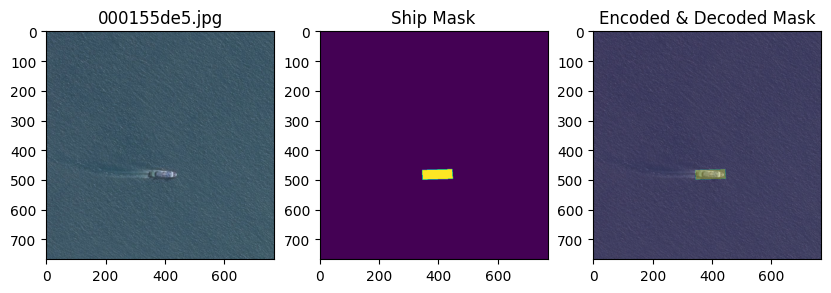

000155de5.jpg  Check Decoding->Encoding RLE_0: 1 -> RLE_1: 1


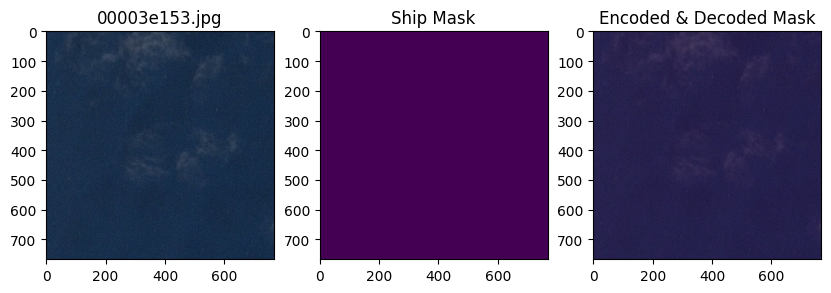

00003e153.jpg  Check Decoding->Encoding RLE_0: 1 -> RLE_1: 0
It could be different when there is no mask.


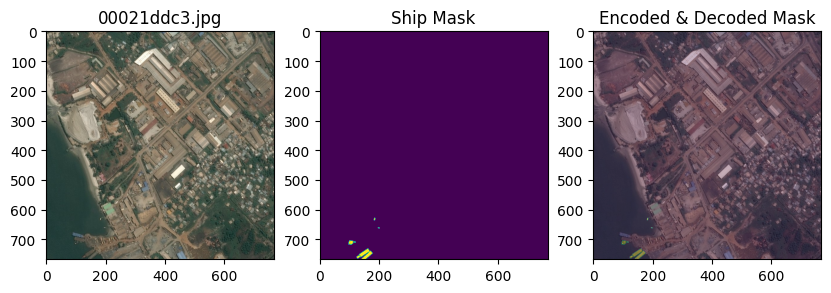

00021ddc3.jpg  Check Decoding->Encoding RLE_0: 9 -> RLE_1: 4
It could be different when there are masks overlapped.


In [ ]:
def multi_rle_encode(img):
    labels = label(img[:, :, 0])
    return [rle_encode(labels==k) for k in np.unique(labels[labels>0])]

def rle_encode(img):

    pixels = img.T.flatten()

    pixels = np.concatenate([[0], pixels, [0]])

    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1

    runs[1::2] -= runs[::2]

    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=SHAPE):

    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0::2], s[1::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def masks_as_image(in_mask_list, shape=SHAPE):
    all_masks = np.zeros(shape, dtype = np.int16)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks += rle_decode(mask)
    return np.expand_dims(all_masks, -1)

def shows_decode_encode(image_id, path=TRAIN_DATA_PATH):

    fig, axarr = plt.subplots(1, 3, figsize = (10, 5))
    img_0 = imread(os.path.join(path, image_id))
    axarr[0].imshow(img_0)
    axarr[0].set_title(image_id)
    rle_1 = masks.query('ImageId=="{}"'.format(image_id))['EncodedPixels']
    img_1 = masks_as_image(rle_1)
    axarr[1].imshow(img_1[:, :, 0])
    axarr[1].set_title('Ship Mask')
    rle_2 = multi_rle_encode(img_1)
    img_2 = masks_as_image(rle_2)
    axarr[2].imshow(img_0)
    axarr[2].imshow(img_2[:, :, 0], alpha=0.3)
    axarr[2].set_title('Encoded & Decoded Mask')
    plt.show()
    print(image_id , ' Check Decoding->Encoding',
          'RLE_0:', len(rle_1), '->',
          'RLE_1:', len(rle_2))

shows_decode_encode('000155de5.jpg')
shows_decode_encode('00003e153.jpg')
print('It could be different when there is no mask.')
shows_decode_encode('00021ddc3.jpg')
print('It could be different when there are masks overlapped.')

## Split Test and Validation datasets


unique_img_ids groupby took: 5.362751245498657


,ImageId,ships,RleMaskList
95409,7ed56296e.jpg,1,[452896 1 453663 3 454430 5 455197 7 455964 9 ...
109043,90f5a8b24.jpg,3,[118623 1 119390 4 120158 6 120925 8 121693 7 ...
37992,3295f93cb.jpg,4,[232473 2 233239 4 234005 7 234770 10 235536 1...


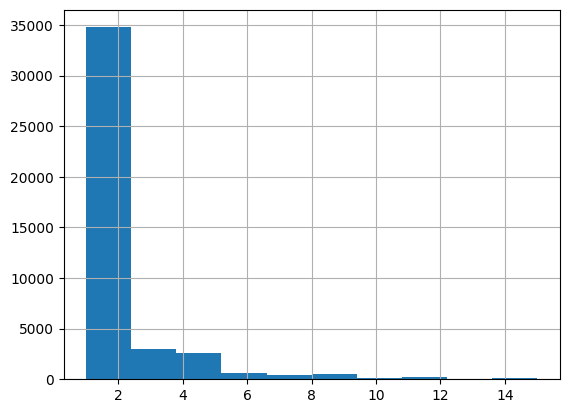

In [ ]:

masks['ships'] = masks['EncodedPixels'].map(lambda encoded_pixels: 1 if isinstance(encoded_pixels, str) else 0)

start_time = time.time()
unique_img_ids = masks.groupby('ImageId').agg({'ships': 'sum'})
unique_img_ids['RleMaskList'] = masks.groupby('ImageId')['EncodedPixels'].apply(list)
unique_img_ids = unique_img_ids.reset_index()
end_time = time.time() - start_time
print("unique_img_ids groupby took: {}".format(end_time))
unique_img_ids = unique_img_ids[unique_img_ids['ships'] > 0]
unique_img_ids['ships'].hist()
unique_img_ids.sample(3)

34044 training masks
8512 validation masks


<Axes: >

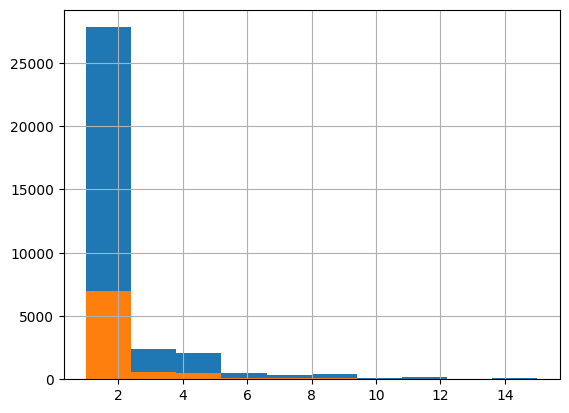

In [ ]:

from sklearn.model_selection import train_test_split
train_ids, val_ids = train_test_split(unique_img_ids,
                 test_size = TRAINING_VALIDATION_RATIO,
                 stratify = unique_img_ids['ships'])
print(train_ids.shape[0], 'training masks')
print(val_ids.shape[0], 'validation masks')
train_ids['ships'].hist()
val_ids['ships'].hist()


In [ ]:
import os
UPDATE_MASK_RCNN = False

os.chdir(WORKING_DIR)
if UPDATE_MASK_RCNN:
    !rm -rf {MASK_RCNN_PATH}

if not os.path.exists(MASK_RCNN_PATH):
    ! wget https://github.com/kart/Mask_RCNN/archive/master.zip -O Mask_RCNN-master.zip
    ! unzip Mask_RCNN-master.zip 'Mask_RCNN-master/mrcnn/*'
    ! rm Mask_RCNN-master.zip


sys.path.append(MASK_RCNN_PATH)
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

/content/kaggle/working/Mask_RCNN-master/mrcnn/model.py:2370: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if os.name is 'nt':


In [ ]:
class AirbusShipDetectionChallengeDataset(utils.Dataset):
    def __init__(self, image_file_dir, ids, masks, image_width=IMAGE_WIDTH, image_height=IMAGE_HEIGHT):
        super().__init__(self)
        self.image_file_dir = image_file_dir
        self.ids = ids
        self.masks = masks
        self.image_width = image_width
        self.image_height = image_height

        self.add_class(SHIP_CLASS_NAME, 1, SHIP_CLASS_NAME)
        self.load_dataset()

    def load_dataset(self):
        for index, row in self.ids.iterrows():
            image_id = row['ImageId']
            image_path = os.path.join(self.image_file_dir, image_id)
            rle_mask_list = row['RleMaskList']
            self.add_image(
                SHIP_CLASS_NAME,
                image_id=image_id,
                path=image_path,
                width=self.image_width, height=self.image_height,
                rle_mask_list=rle_mask_list)

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        rle_mask_list = info['rle_mask_list']
        mask_count = len(rle_mask_list)
        mask = np.zeros([info['height'], info['width'], mask_count],
                        dtype=np.uint8)
        i = 0
        for rel in rle_mask_list:
            if isinstance(rel, str):
                np.copyto(mask[:,:,i], rle_decode(rel))
            i += 1
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info['source'] == SHIP_CLASS_NAME:
            return info['path']
        else:
            super(self.__class__, self).image_reference(image_id)

In [ ]:
class AirbusShipDetectionChallengeGPUConfig(Config):
    NAME = 'ASDC_GPU'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

    NUM_CLASSES = 2
    IMAGE_MIN_DIM = IMAGE_WIDTH
    IMAGE_MAX_DIM = IMAGE_WIDTH
    STEPS_PER_EPOCH = 300
    VALIDATION_STEPS = 50
    SAVE_BEST_ONLY = True
    DETECTION_MIN_CONFIDENCE = 0.95
    DETECTION_NMS_THRESHOLD = 0.05

config = AirbusShipDetectionChallengeGPUConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.95
DETECTION_NMS_THRESHOLD        0.05
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  768
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  768
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [768 768   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE           

## Prepare and load training dataset


<ipython-input-7-4406c527fd0f>:36: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)


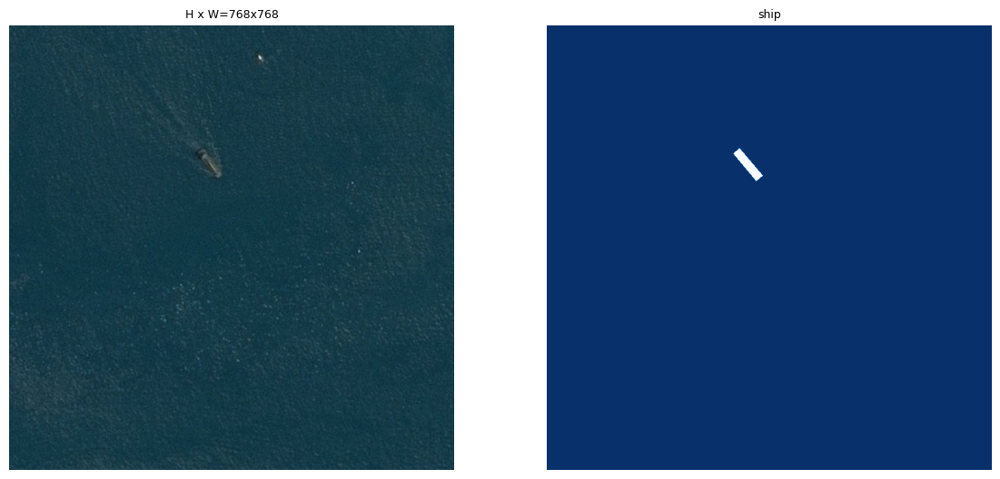

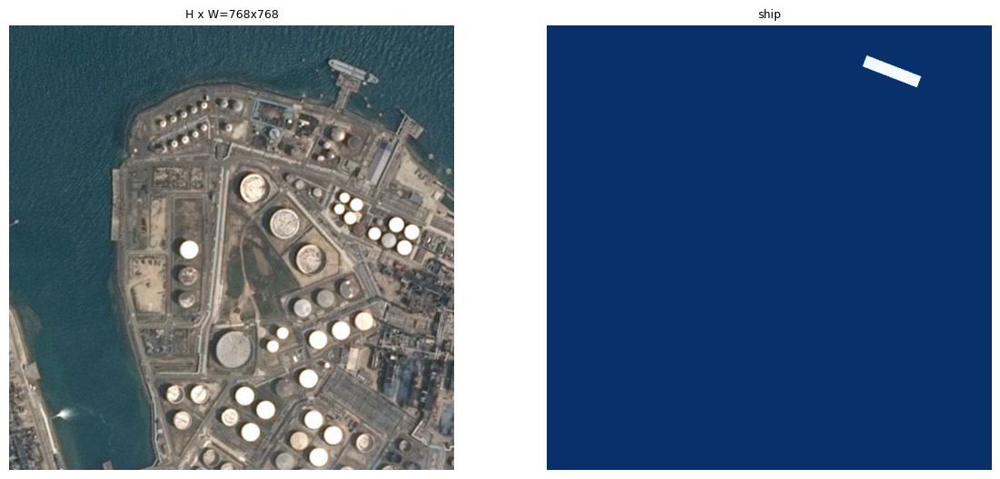

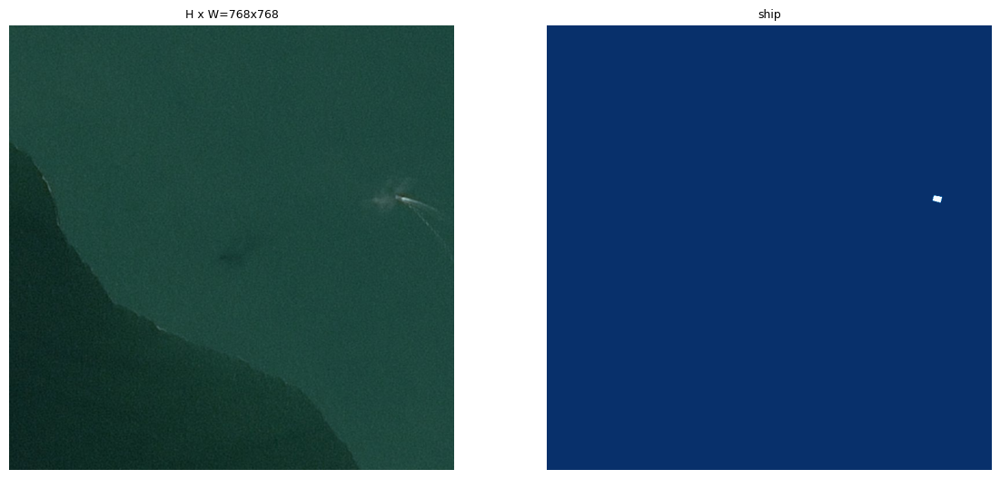

dataset prepare: 5.673537731170654


In [ ]:
start_time = time.time()
dataset_train = AirbusShipDetectionChallengeDataset(image_file_dir=TRAIN_DATA_PATH, ids=train_ids, masks=masks)
dataset_train.prepare()
dataset_val = AirbusShipDetectionChallengeDataset(image_file_dir=TRAIN_DATA_PATH, ids=val_ids, masks=masks)
dataset_val.prepare()

image_ids = np.random.choice(dataset_train.image_ids, 3)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

end_time = time.time() - start_time
print("dataset prepare: {}".format(end_time))

## Load pre-trained weights
Pre-trained weights for MS COCO is loaded to provide a better straing point for training.

In [ ]:
import tensorflow as tf
tf.compat.v1.disable_eager_execution()


In [ ]:
start_time = time.time()
model = modellib.MaskRCNN(mode="training", config=config, model_dir=WORKING_DIR)

import errno
try:
    weights_path = model.find_last()
    load_weights = True
except FileNotFoundError:
    load_weights = True
    weights_path = COCO_WEIGHTS_PATH
    utils.download_trained_weights(weights_path)

if load_weights:
    print("Loading weights: ", weights_path)
    model.load_weights(weights_path, by_name=True, exclude=[
                "mrcnn_class_logits", "mrcnn_bbox_fc",
                "mrcnn_bbox", "mrcnn_mask"])

end_time = time.time() - start_time
print("loading weights: {}".format(end_time))

TypeError: ignored

In [ ]:
!mv /model.py /content/kaggle/working/Mask_RCNN-master/mrcnn/model.py

# Train the model

In [ ]:

start_time = time.time()
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE * 1.5,
            epochs=5,
            layers='all')
end_time = time.time() - start_time
print("Train model: {}".format(end_time))


Starting at epoch 0. LR=0.0015

Checkpoint Path: /kaggle/working/asdc_gpu20190831T1302/mask_rcnn_asdc_gpu_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b   

/opt/conda/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/opt/conda/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/opt/conda/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/opt/conda/lib/python3.6/site-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multiprocessing=True` and multiple worker

Epoch 1/5
300/300 [==============================] - 320s 1s/step - loss: 1.1494 - rpn_class_loss: 0.0137 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.3604 - mrcnn_mask_loss: 0.3115 - val_loss: 1.3324 - val_rpn_class_loss: 0.0168 - val_rpn_bbox_loss: 0.6377 - val_mrcnn_class_loss: 0.0551 - val_mrcnn_bbox_loss: 0.2997 - val_mrcnn_mask_loss: 0.3232
Epoch 2/5
300/300 [==============================] - 253s 842ms/step - loss: 0.9392 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 0.3684 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.2426 - mrcnn_mask_loss: 0.2743 - val_loss: 1.0614 - val_rpn_class_loss: 0.0109 - val_rpn_bbox_loss: 0.5029 - val_mrcnn_class_loss: 0.0233 - val_mrcnn_bbox_loss: 0.2541 - val_mrcnn_mask_loss: 0.2701
Epoch 3/5
300/300 [==============================] - 250s 833ms/step - loss: 0.8708 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.3276 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.2261 - mrcnn_mask_loss: 0.2727 - val_loss: 0.9469 - val_rpn_clas

# Inference


Loading weights from  /kaggle/working/asdc_gpu20190831T1302/mask_rcnn_asdc_gpu_0003.h5
Re-starting from epoch 3
original_image           shape: (768, 768, 3)         min:    0.00000  max:  250.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 7698.00000  int64
gt_class_id              shape: (3,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (3, 4)                min:    0.00000  max:  263.00000  int32
gt_mask                  shape: (768, 768, 3)         min:    0.00000  max:    1.00000  bool


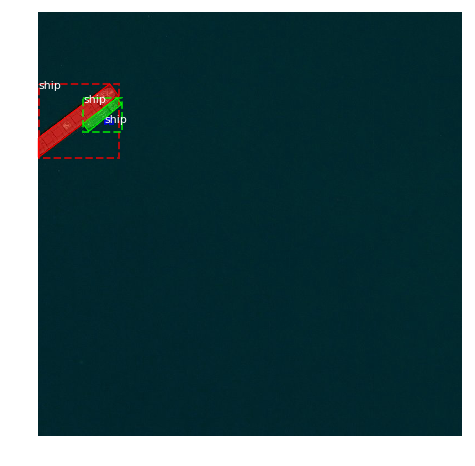

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  250.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


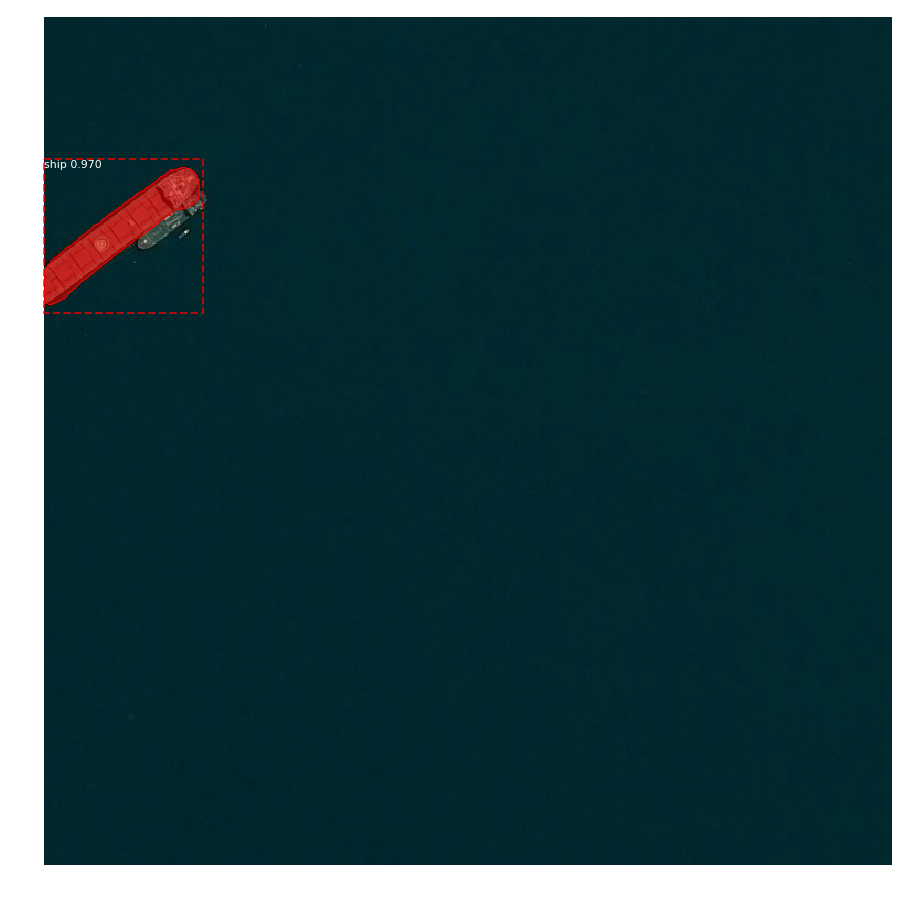

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


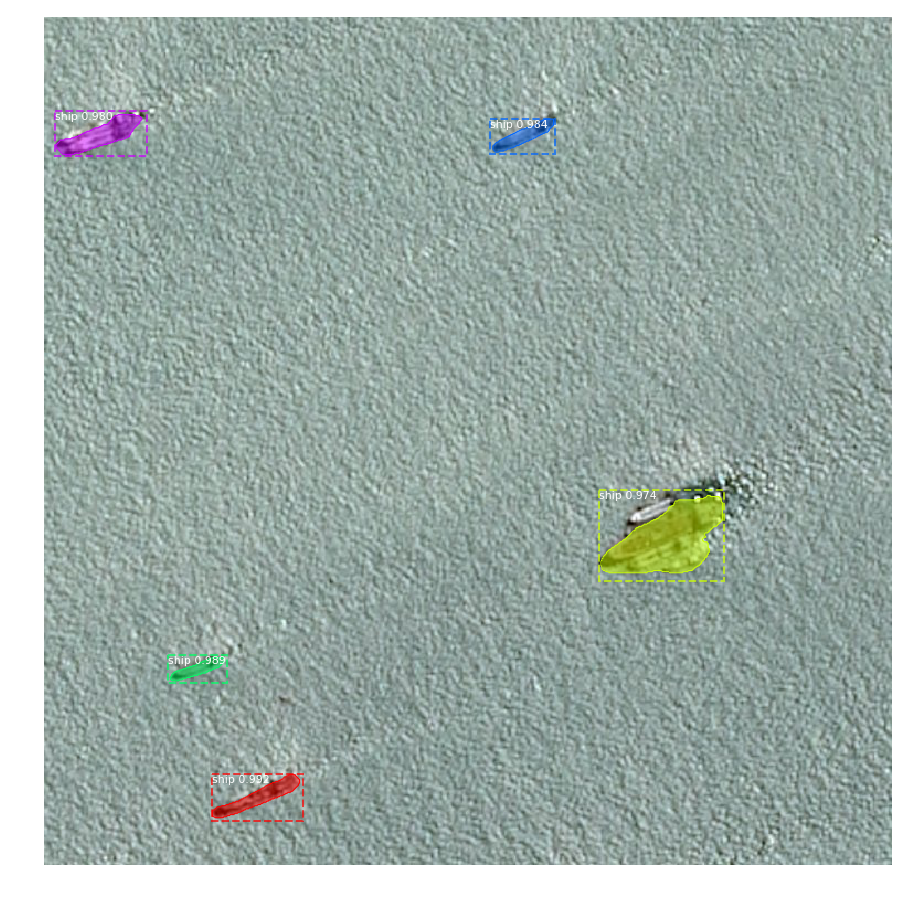

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -107.70000  max:  147.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



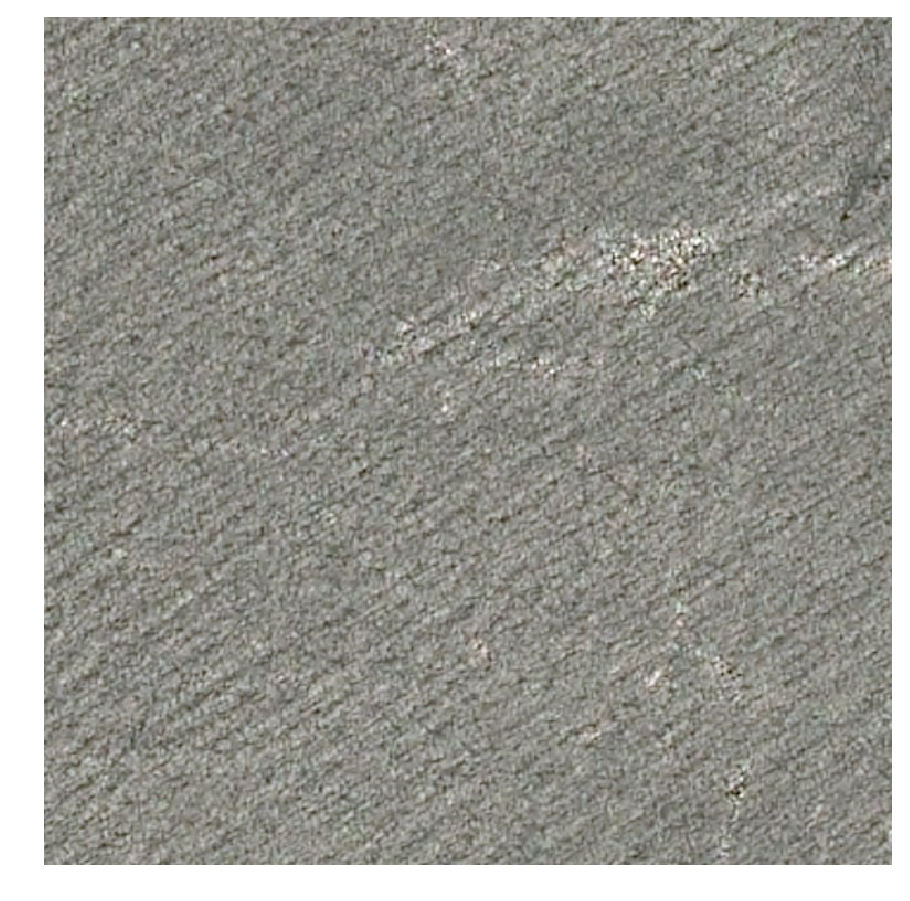

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  250.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  139.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


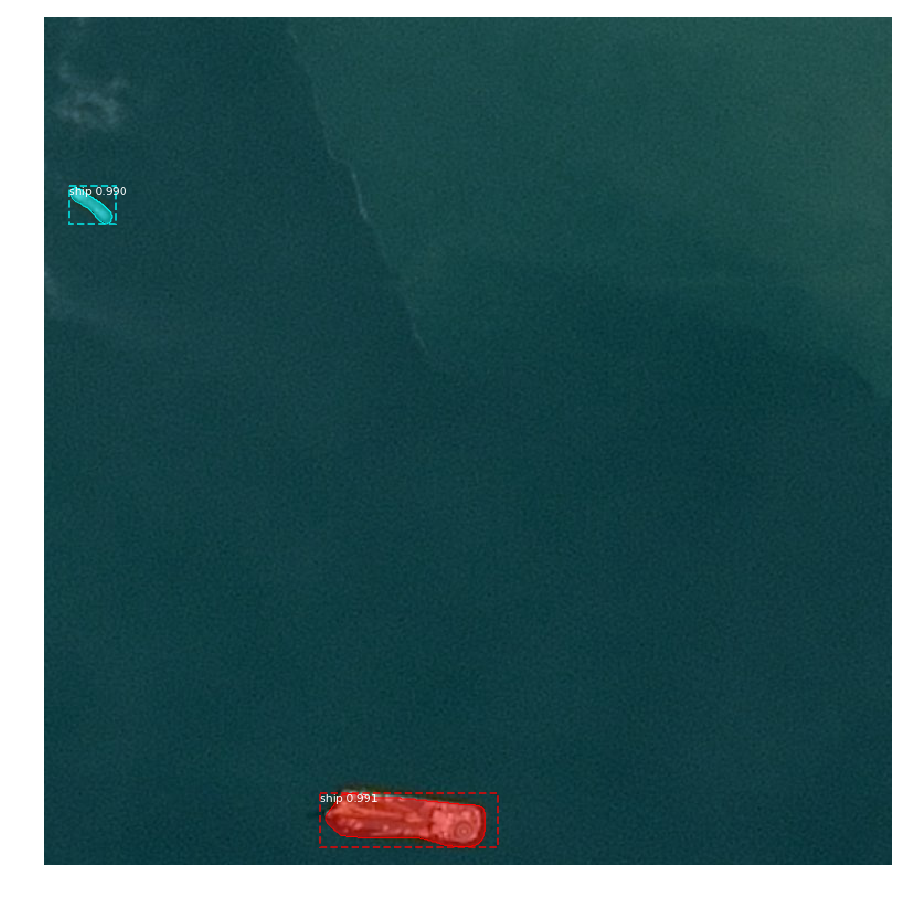

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



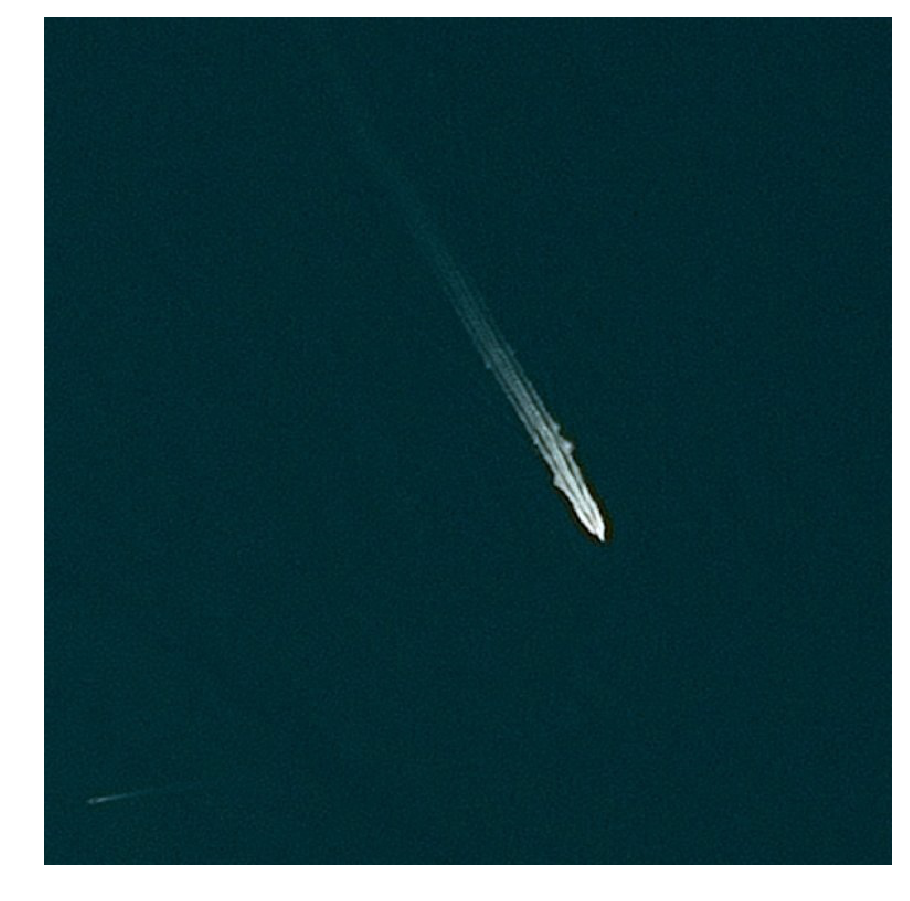

Processing 1 images
image                    shape: (768, 768, 3)         min:    4.00000  max:  196.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -119.70000  max:   92.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


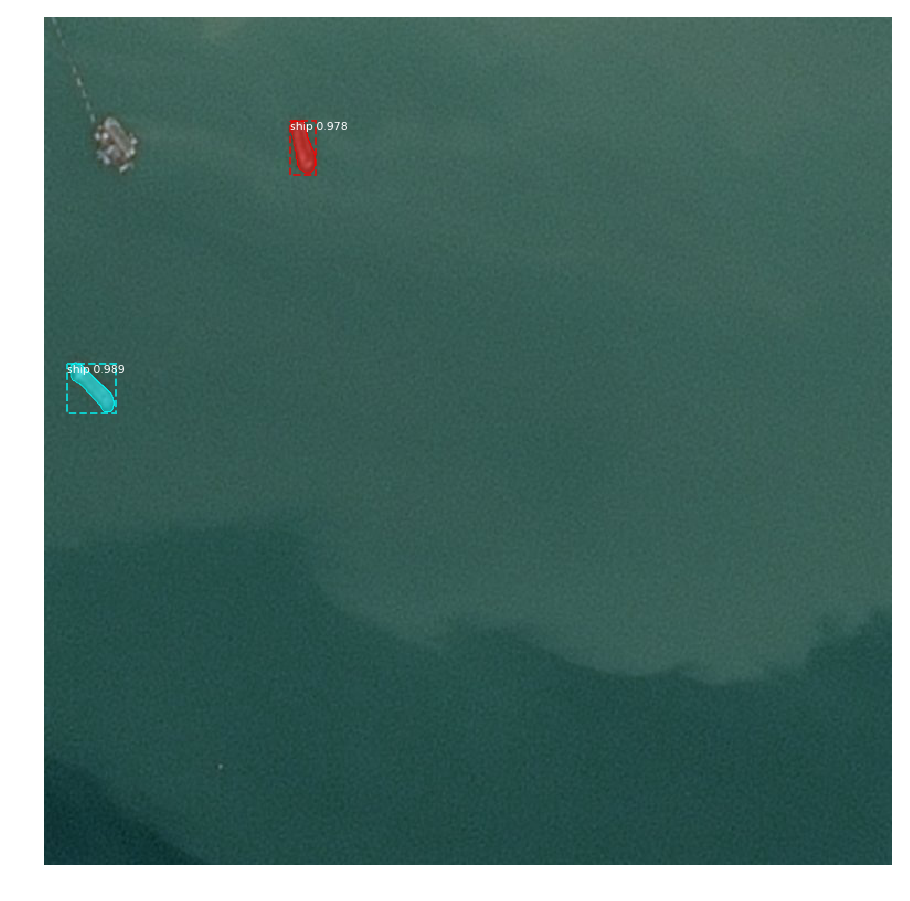

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  233.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -103.90000  max:  115.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


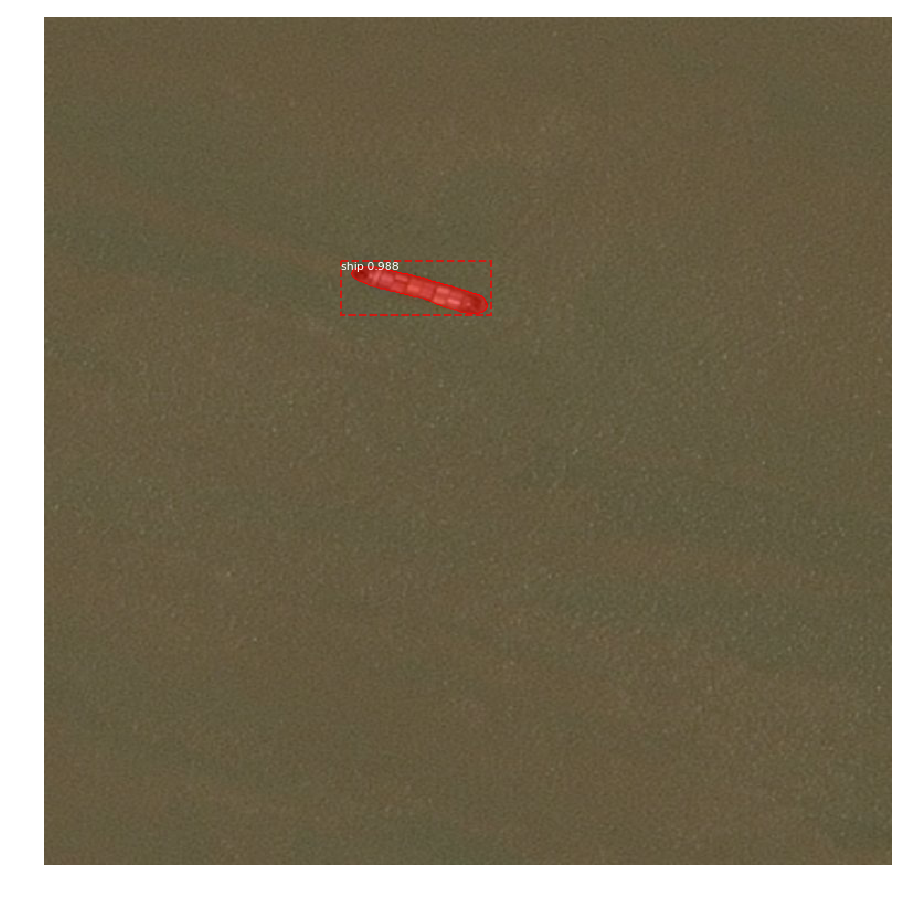

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  158.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   54.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



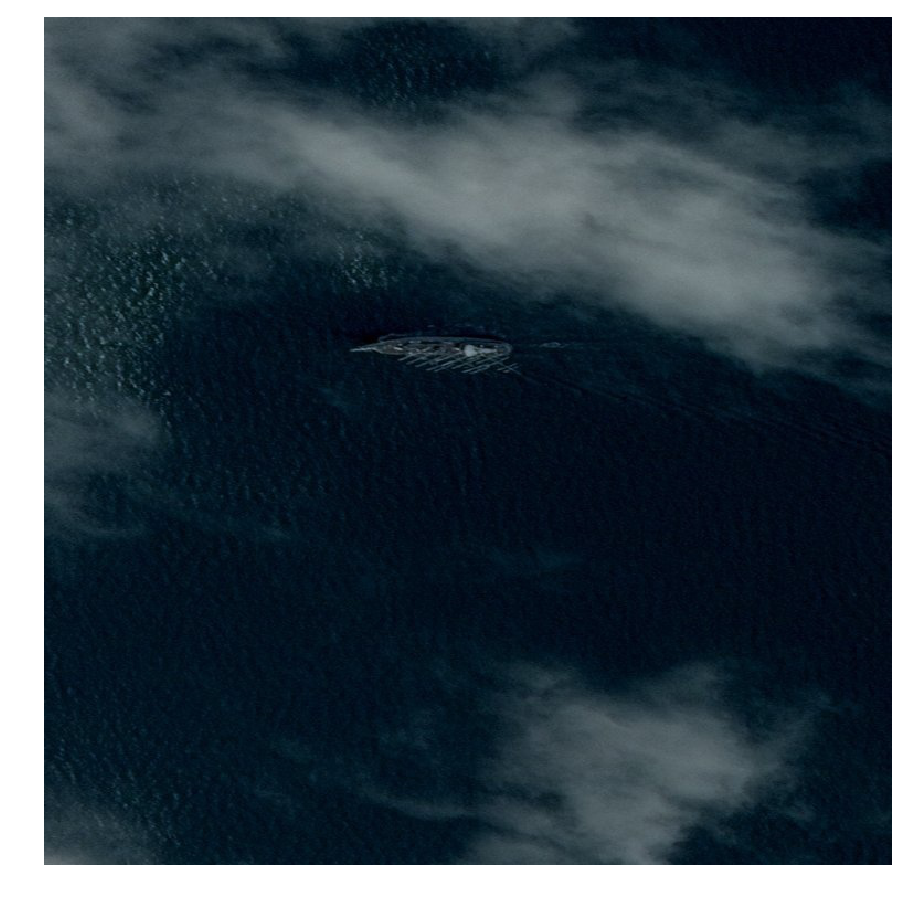

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


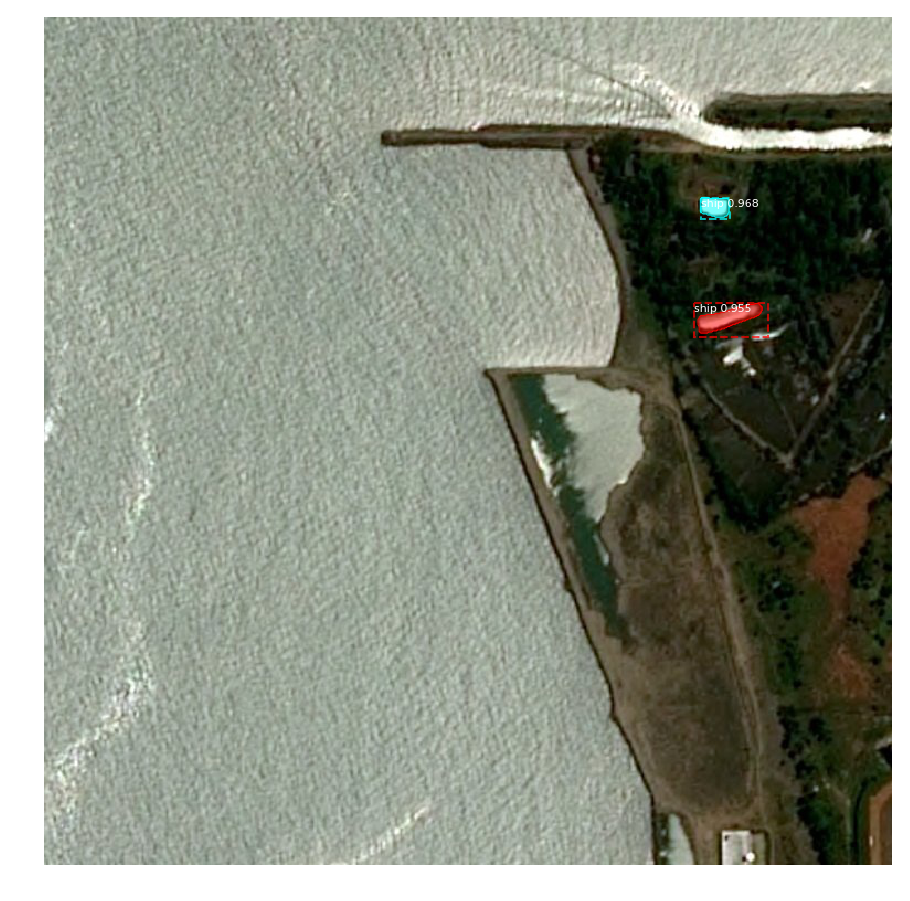

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  144.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


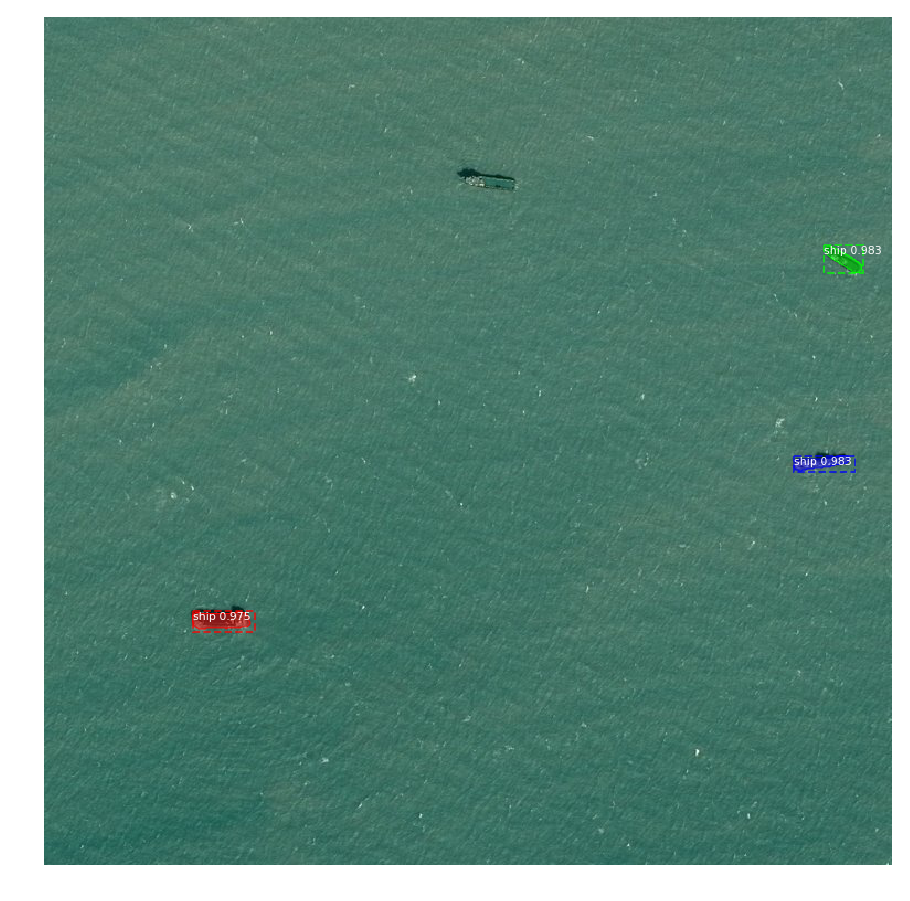

Processing 1 images
image                    shape: (768, 768, 3)         min:    1.00000  max:  247.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -122.70000  max:  143.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


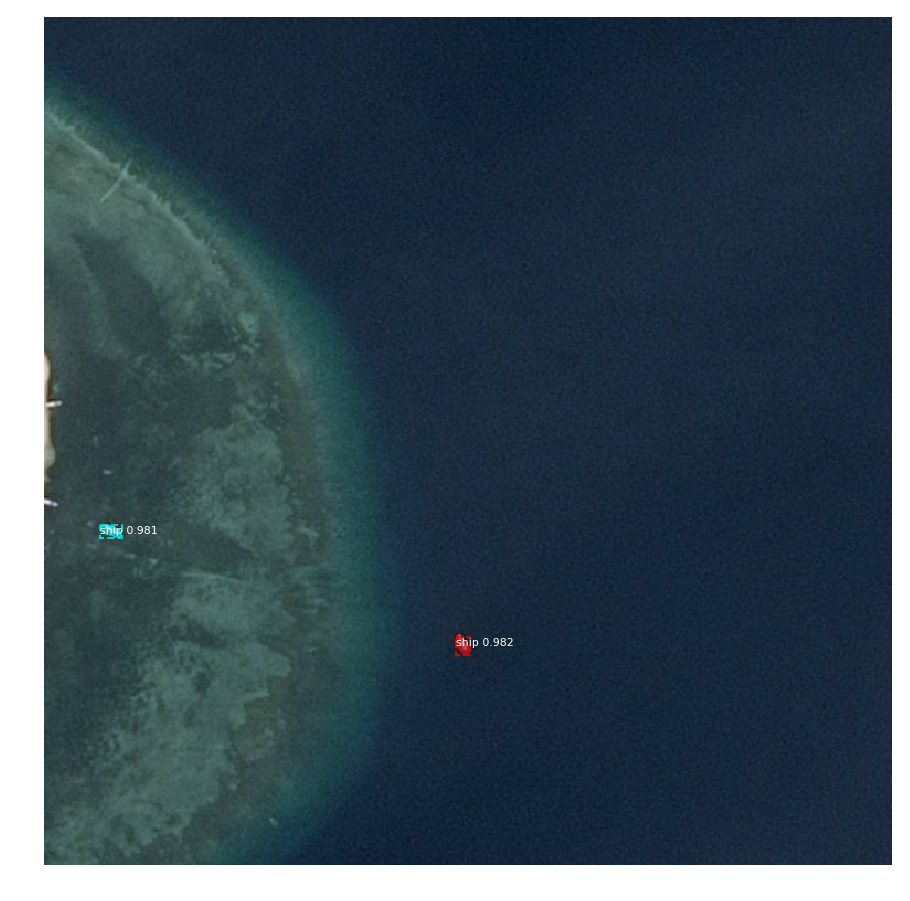

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  233.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  126.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


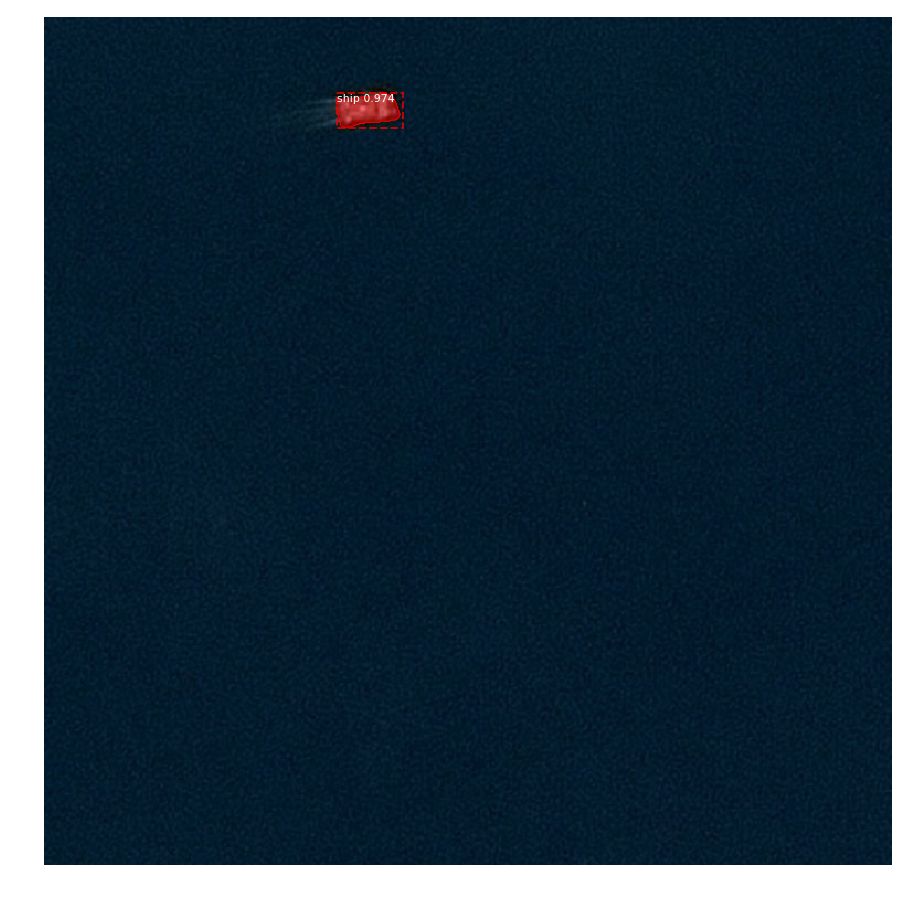

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  231.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  127.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



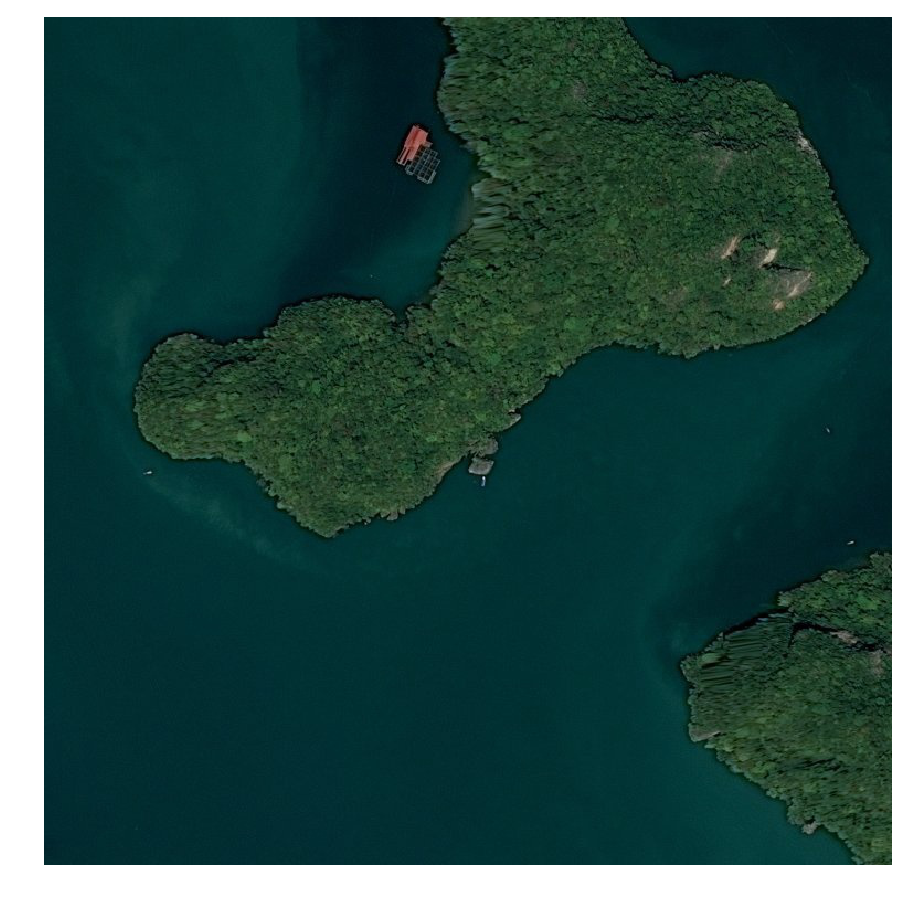

Processing 1 images
image                    shape: (768, 768, 3)         min:   36.00000  max:  244.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -68.70000  max:  120.30000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


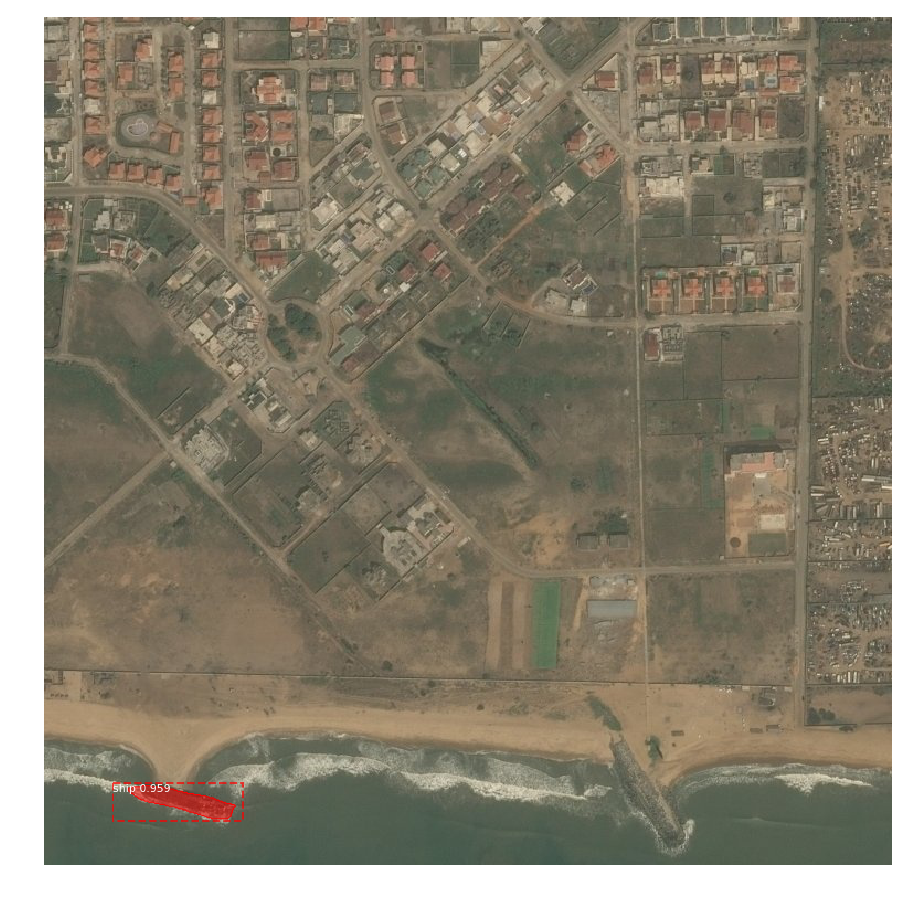

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  182.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   70.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32

*** No instances to display *** 



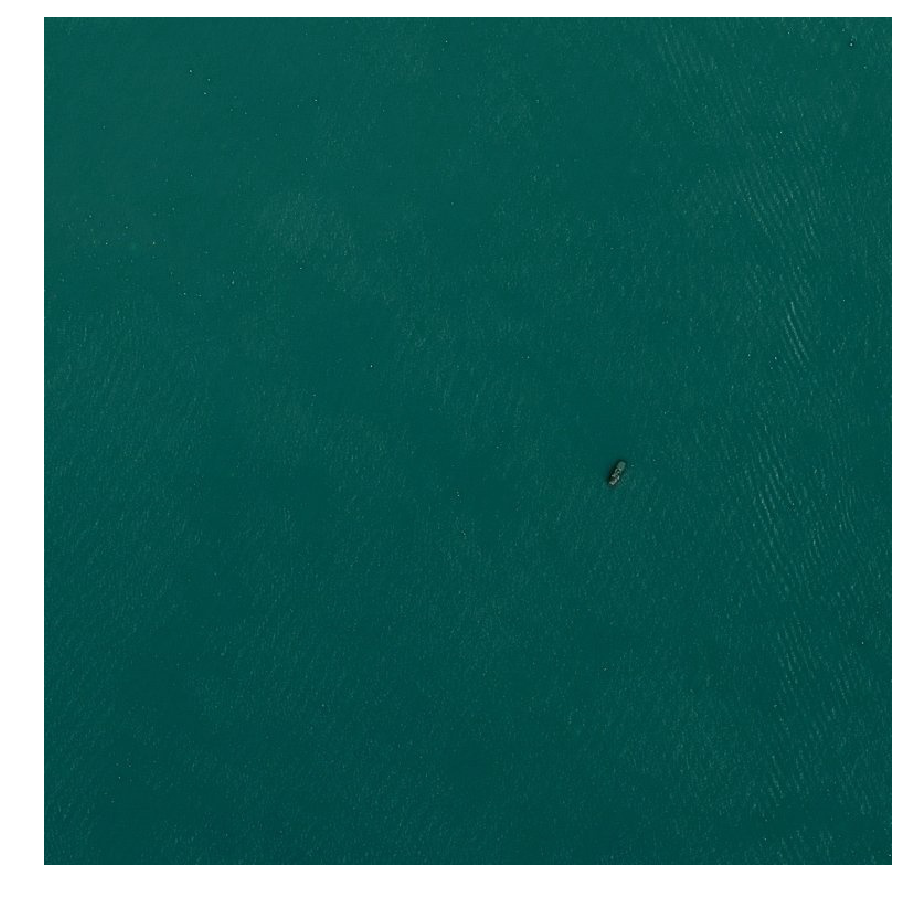

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  181.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:   77.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


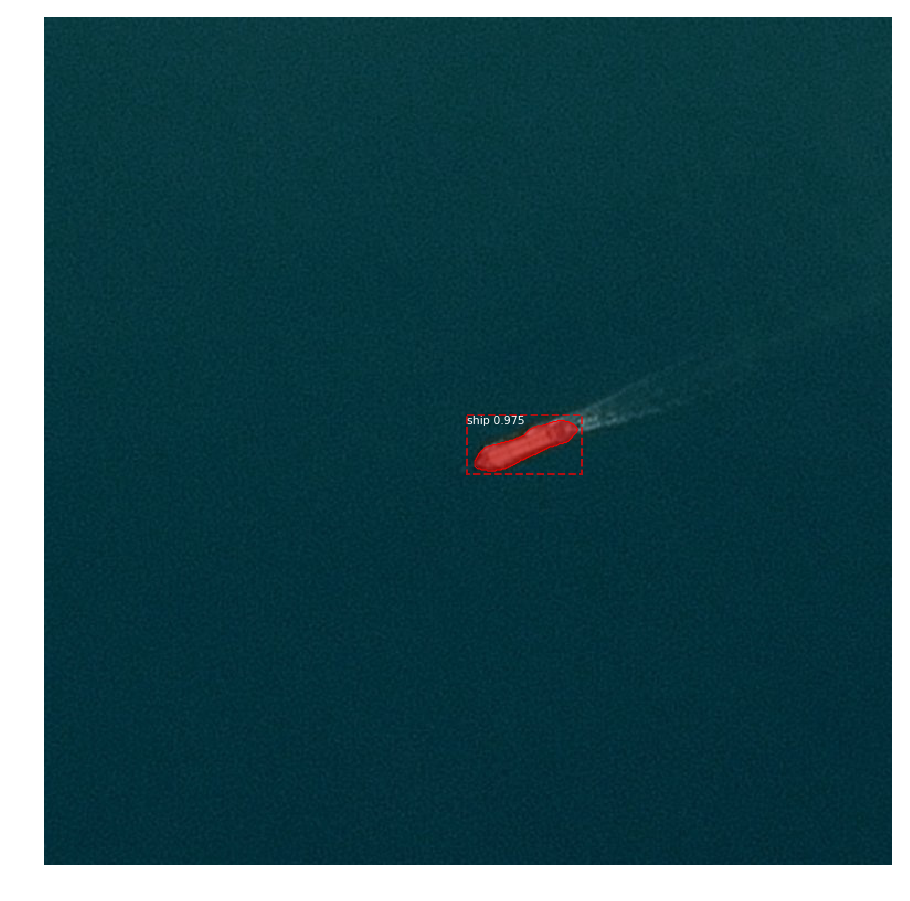

Processing 1 images
image                    shape: (768, 768, 3)         min:   47.00000  max:  233.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:  -76.70000  max:  129.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


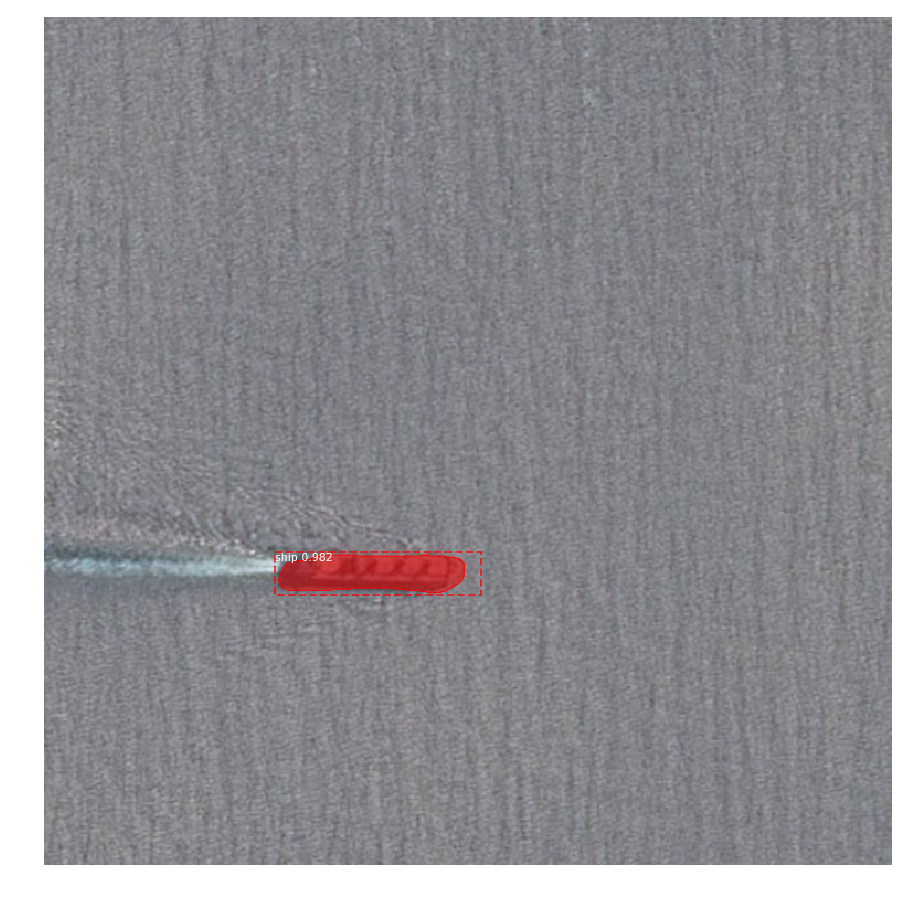

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  147.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


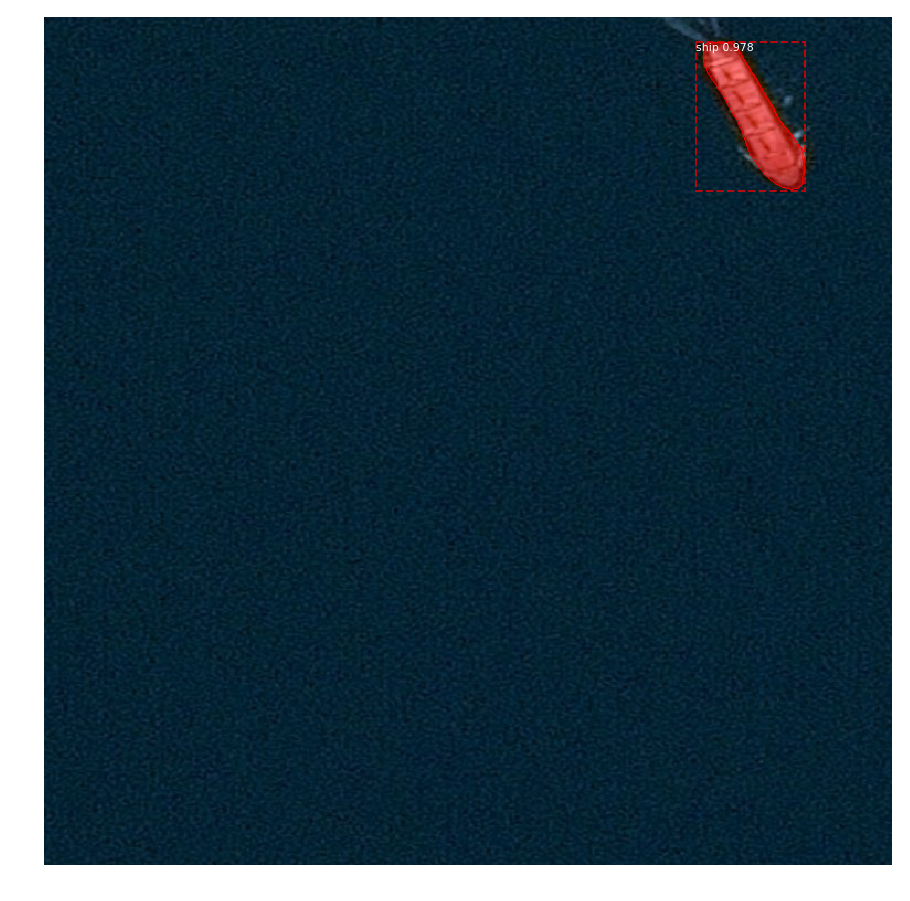

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  225.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  113.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


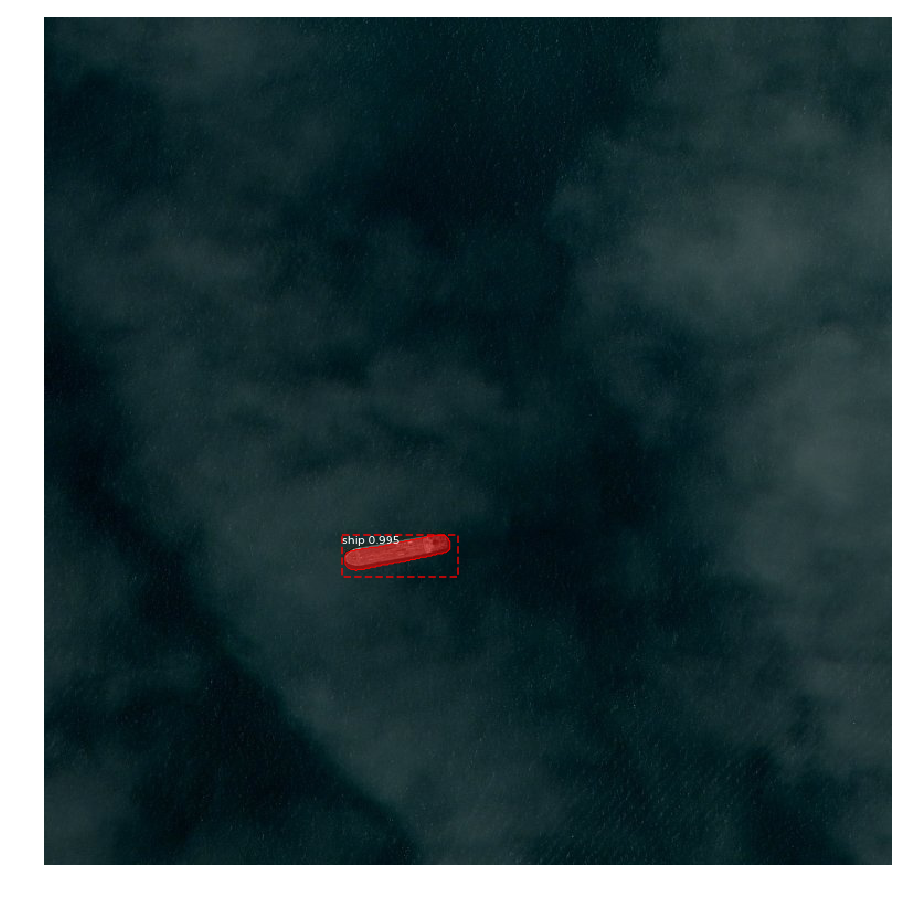

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


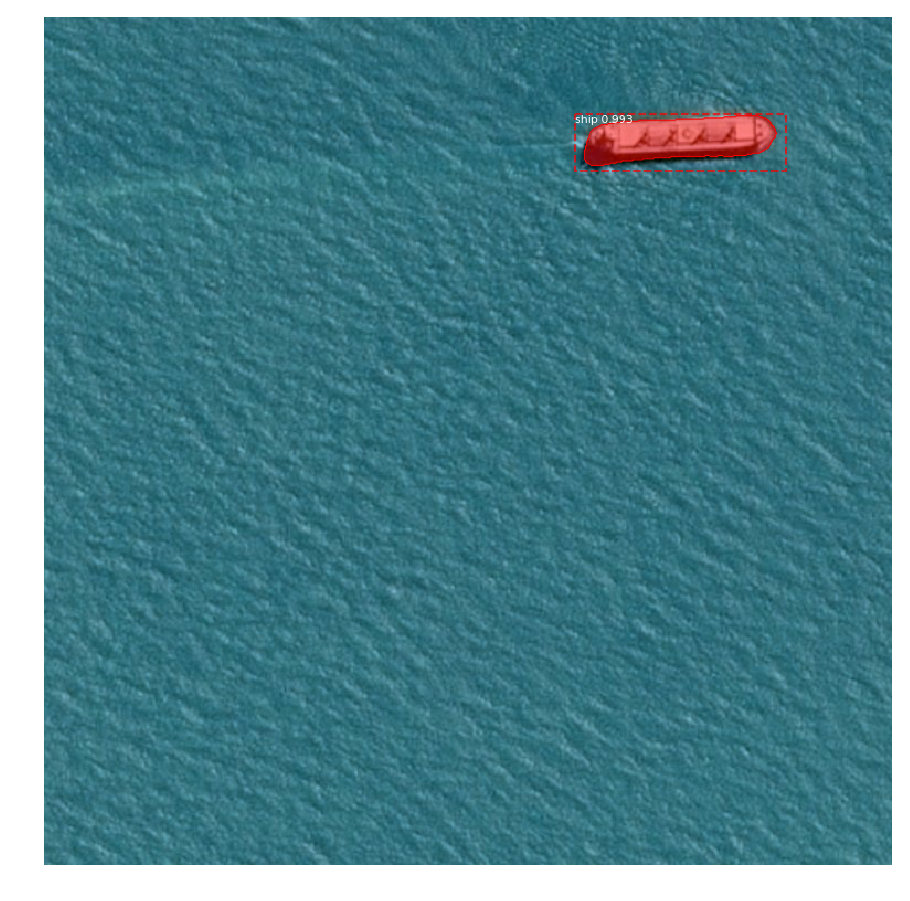

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min: -123.70000  max:  143.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  768.00000  int64
anchors                  shape: (1, 147312, 4)        min:   -0.47202  max:    1.38858  float32


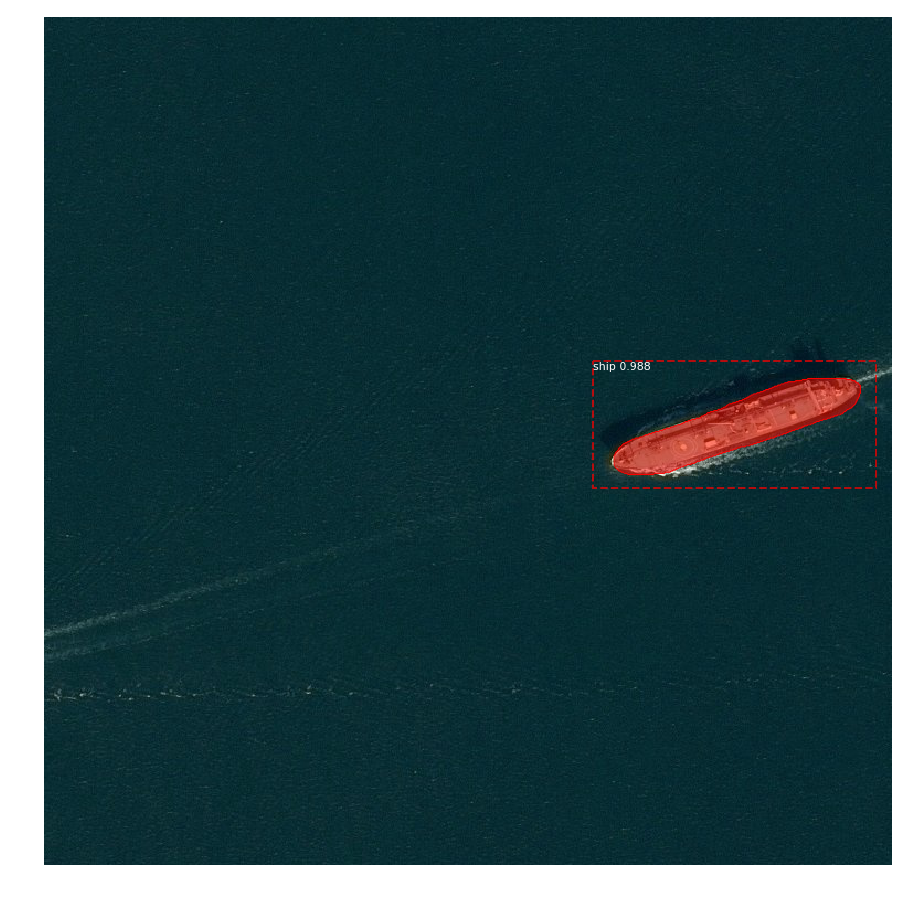

Inference Time: 0.31 Minutes
mAP:  0.5958333334575097


In [ ]:
class InferenceConfig(AirbusShipDetectionChallengeGPUConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()
infer_model = modellib.MaskRCNN(mode="inference",
                          config=inference_config,
                          model_dir=WORKING_DIR)

model_path = infer_model.find_last()

print("Loading weights from ", model_path)
infer_model.load_weights(model_path, by_name=True)

image_id = np.random.choice(dataset_val.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config,
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id,
                            dataset_train.class_names, figsize=(8, 8))

results = infer_model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'],
                            dataset_val.class_names, r['scores'])

image_ids = np.random.choice(dataset_val.image_ids, 20)
APs = []
inference_start = time.time()
for image_id in image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    results = infer_model.detect([image], verbose=1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                            dataset_val.class_names, r['scores'])

    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)

inference_end = time.time()
print('Inference Time: %0.2f Minutes'%((inference_end - inference_start)/60))
print("mAP: ", np.mean(APs))
